# Capture

In [1]:
push!(LOAD_PATH,"../src/")

using CaptureRate 
# contains functions for:
    # solving harmonic potential (calc_harm_wave_func) 
    # general polynomial potential (calc_poly_wave_func)
    # calculating phonon overlap (calc_overlap)
    # calculating capture coefficient (calc_capt_coeff)

# input for calc_harm_wave_func requires:
    # ħω1, ħω2: the energies [eV] (frequency * hbar) of each of the potentials
    # ΔQ and ΔE are the horizontal (configuration coordinate [amu^(1/2)*Å]) and vertical (energetic [eV]) differences between potential minima
    # Qi and Qf [amu^(1/2)*Å] define the domain where potential will be solved (Q ∈ [`Qi`,`Qf`]), discretized in `NQ` steps
    # `nev` the number of first energy levels of 1D potentials to solve. 
    # You can also include an additional argument nev2 = XX to solve for a different number of states in the second potential (by default nev2 = nev)

# input for calc_poly_wave_func requires:
    # potential_matrix_1 & potential_matrix_2 are for reading in potentials from files (named Potential_1.csv and Potential_2.csv?).
    # Each potential is read from a file with Q and E in columns 1 and 2 respectively. 
    # poly_order: order of the polynomial that you'd like to use to fit your potential data
    # Qi and Qf [amu^(1/2)*Å] define the domain where potential will be solved (Q ∈ [`Qi`,`Qf`]), discretized in `NQ` steps
    # `nev` the number of first energy levels of 1D potentials to solve. 
    # You can also include an additional argument nev2 = XX to solve for a different number of states in the second potential (by default nev2 = nev)

# input for calc_overlap requires:
    # cut_off=0.25, 
    # σ=0.025

# input for calc_capt_coeff requires:
# V = 1.1E-21          # [Å³] volume of supercell
# g = 1                # degeneracy (spin?)
# W = 0.204868962802   # [ev/(amu^(1/2)*Å)]

using Plots

┌ Info: Recompiling stale cache file /Users/samhood/.julia/compiled/v1.0/CaptureRate.ji for CaptureRate [top-level]
└ @ Base loading.jl:1184


# $\mathrm{GaN:C_N}$

In [10]:
cc = CaptureRate.calc_harm_wave_func(0.042, 0.036,
        -1.61, -1.02; Qi=-10, Qf=10, NQ=1000, nev=30)
CaptureRate.plot_potentials(cc)
ylims!(-1.5, 0.5)
xlims!(-4, 3)
CaptureRate.calc_overlap!(cc; cut_off=0.25, σ=0.01)
ylims!(-1.5, 0.5)
xlims!(-5, 2.5)

occupation of the highest eigenvalue at the highest temperature:2.768525565852215e-7
occupation(ϵ_max, T_max): 2.768525565852215e-7


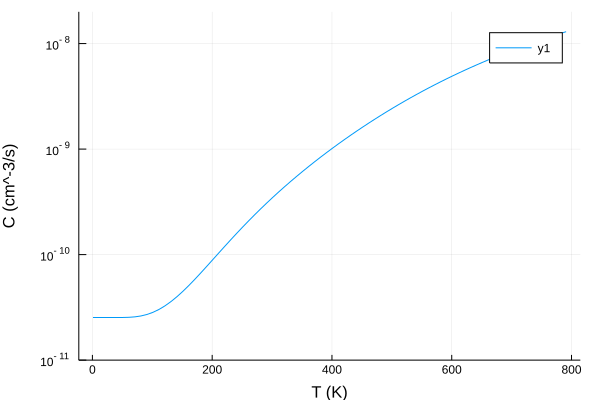

In [18]:
T_range = 1:10:800
c = CaptureRate.calc_capt_coeff(6.4E-2, 1.1E-21, T_range, cc)
plot(T_range, c*4*6) # degeneracy * Sommerfeld factor
yaxis!("C (cm^-3/s)",:log10)
xaxis!("T (K)")
ylims!(1E-11, 2E-8)

# $\mathrm{ZnO:Li_{Zn}}$

In [4]:
cc = CaptureRate.calc_harm_wave_func(0.036, 0.025,
        -3.22, -0.46; Qi=-10, Qf=5, NQ=1000, nev=60)
CaptureRate.calc_overlap!(cc; cut_off=0.5, σ=0.025, lplot=true)
ylims!(-1, 1)
xlims!(-5, 3)

occupation of the highest eigenvalue at the highest temperature:5.621577521642026e-8
occupation(ϵ_max, T_max): 5.621577521642026e-8


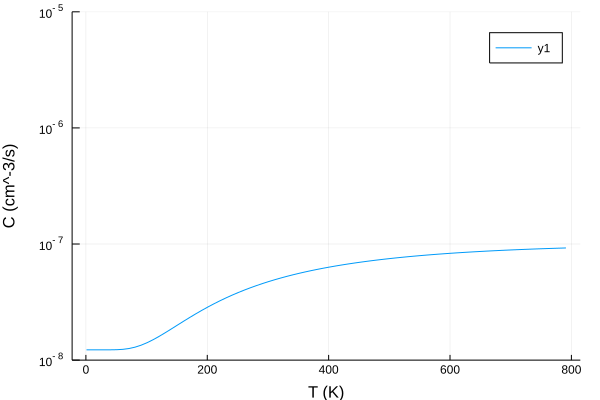

In [5]:
T_range = 1:10:800
c = CaptureRate.calc_capt_coeff(3.9E-2, 1.136E-21, T_range, cc)
plot(T_range, c*4*6) # degeneracy * Sommerfeld factor
yaxis!("C (cm^-3/s)",:log10)
xaxis!("T (K)")
ylims!(1E-8, 1E-5)

# $\mathrm{GaN:C_N}$

In [15]:
cc = CaptureRate.calc_harm_wave_func(0.026, 0.022,
        -3.33, -0.88; Qi=-10, Qf=10, NQ=1000, nev=60)
CaptureRate.calc_overlap!(cc; cut_off=0.5, σ=0.025)
CaptureRate.plot_potentials(cc, scale_factor=3e-2)
ylims!(-1, 0.5)
xlims!(-5, 2)

occupation of the highest eigenvalue at the highest temperature:0.00017719742594353953
occupation(ϵ_max, T_max): 0.00017719742594353953


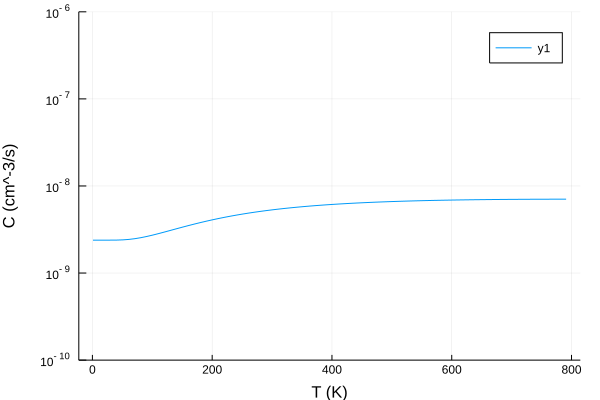

In [7]:
T_range = 1:10:800
c = CaptureRate.calc_capt_coeff(3.9E-2, 1.136E-21, T_range, cc)
plot(T_range, c) # degeneracy * Sommerfeld factor
yaxis!("C (cm^-3/s)",:log10)
xaxis!("T (K)")
ylims!(1E-10, 1E-6)